## 1. Getting Started: Airbnb Copenhagen

This assignment deals with the most recent Airbnb listings in Copenhagen. The data is collected from [Inside Airbnb](http://insideairbnb.com/copenhagen). Feel free to explore the website further in order to better understand the data. The data (*listings.csv*) has been collected as raw data and needs to be preprocessed.

**Hand-in:** Hand in as a group in Itslearning in a **single**, well-organized and easy-to-read Jupyter Notebook. If your group consists of students from different classes, upload in **both** classes.

1. First we need to remove all the redundant columns. Please keep the following 22 columns and remove all others:

    id\
    name  
    host_id  
    host_name  
    neighbourhood_cleansed  
    latitude  
    longitude  
    room_type  
    price  
    minimum_nights  
    number_of_reviews  
    last_review  
    review_scores_rating  
    review_scores_accuracy  
    review_scores_cleanliness  
    review_scores_checkin  
    review_scores_communication  
    review_scores_location  
    review_scores_value  
    reviews_per_month  
    calculated_host_listings_count  
    availability_365



2. Next we have to handle missing values. Remove all rows where `number_of_reviews = 0`. If there are still missing values, remove the rows that contain them so you have a data set with no missing values.

3. Fix the `neighbourhood_cleansed` values (some are missing 'æ ø å'), and if necessary change the price to DKK.

4. Create a fitting word cloud based on the `name` column. Feel free to remove non-descriptive stop words (e.g. since this is about Copenhagen, perhaps the word 'Copenhagen' is redundant).

5. Since data science is so much fun, provide a word cloud of the names of the hosts, removing any names of non-persons. Does this more or less correspond with the distribution of names according to [Danmarks Statistik](https://www.dst.dk/da/Statistik/emner/borgere/navne/navne-i-hele-befolkningen)?

6. Create a new column using bins of price. Use 11 bins, evenly distributed but with the last bin $> 10,000$.

7. Using non-scaled versions of latitude and longitude, plot the listings data on a map. Use the newly created price bins as a color parameter. Also, create a plot (i.e. another plot) where you group the listings with regard to the neighbourhood.

8. Create boxplots where you have the neighbourhood on the x-axis and price on the y-axis. What does this tell you about the listings in Copenhagen? Keep the x-axis as is and move different variables into the y-axis to see how things are distributed between the neighborhoods to create different plots (your choice).

9. Create a bar chart of the hosts with the top ten most listings. Place host id on the x-axis and the count of listings on the y-axis.

10. Do a descriptive analysis of the neighborhoods. Include information about room type in the analysis as well as one other self-chosen feature. The descriptive analysis should contain mean/average, mode, median, standard deviation/variance, minimum, maximum and quartiles.

11. Supply a list of the top 10 highest rated listings and visualize them on a map.

12. Now, use any preprocessing and feature engineering steps that you find relevant before proceeding (optional).

13. Create another new column, where the price is divided into two categories: "expensive" listings defined by all listings with a price higher than the median price, and "affordable" listings defined by all listings with a price equal to or below the median price. You can encode the affordable listings as "0" and the expensive ones as "1". All listings should now have a classification indicating either expensive listings (1) or affordable listings (0).

14. Based on self-chosen features, develop a Naïve Bayes and k-Nearest Neighbor model to determine whether a rental property should be classified as 0 or 1. Remember to divide your data into training data and test data. Comment on your findings.

15. Try to come up with a final conclusion to the Airbnb-Copenhagen assignment.


In [654]:
import pandas as pd
import numpy as np
from spellchecker import SpellChecker
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import folium
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, classification_report
from sklearn.preprocessing import LabelEncoder

In [655]:
whole_dataset = pd.read_csv("listings.csv")
whole_dataset[0:10]
cleaned_dataset = whole_dataset[['id',
    'name',  
    'host_id',  
    'host_name',  
    'neighbourhood_cleansed',  
    'latitude',  
    'longitude',  
    'room_type',  
    'price',  
    'minimum_nights',  
    'number_of_reviews',  
    'last_review',  
    'review_scores_rating',  
    'review_scores_accuracy',  
    'review_scores_cleanliness',  
    'review_scores_checkin',  
    'review_scores_communication',  
    'review_scores_location',  
    'review_scores_value',  
    'reviews_per_month',  
    'calculated_host_listings_count',  
    'availability_365']]
cleaned_dataset[0:10]
display(cleaned_dataset.shape)


(13815, 22)

In [656]:
#Dropping ones with 0 reviews
data = cleaned_dataset[cleaned_dataset['number_of_reviews'] != 0]
display(data.shape)
data.dropna(inplace=True)
display(data.shape)

(12170, 22)

C:\Users\Lukas\AppData\Local\Temp\ipykernel_18172\4192727249.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.dropna(inplace=True)


(12126, 22)

In [657]:
#Letter adjustment and currency change
data['neighbourhood_cleansed'].replace({'Nrrebro': 'Nørrebro'}, inplace=True)
data['neighbourhood_cleansed'].replace({'sterbro': 'Østerbro'}, inplace=True)
data['neighbourhood_cleansed'].replace({'Vanlse': 'Vanløse'}, inplace=True)
data['neighbourhood_cleansed'].replace({'Brnshj-Husum': 'Brønshøj-Husum'}, inplace=True)

#Replacing currency
display(data[0:10])

def update_price(price_str):
    if '$' in price_str:
        price_str = price_str.replace(',', '')
        price_str = (float(price_str[1:]) * 7)  # Remove the dollar sign and convert to float
        return f'{price_str}'
    return price_str

data['price'] = data['price'].apply(update_price)
display(data[0:10])


C:\Users\Lukas\AppData\Local\Temp\ipykernel_18172\224990225.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['neighbourhood_cleansed'].replace({'Nrrebro': 'Nørrebro'}, inplace=True)
C:\Users\Lukas\AppData\Local\Temp\ipykernel_18172\224990225.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['neighbourhood_cleansed'].replace({'sterbro': 'Østerbro'}, inplace=True)
C:\Users\Lukas\AppData\Local\Temp\ipykernel_18172\224990225.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_

,id,name,host_id,host_name,neighbourhood_cleansed,latitude,longitude,room_type,price,minimum_nights,...,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,reviews_per_month,calculated_host_listings_count,availability_365
0,6983,Copenhagen 'N Livin',16774,Simon,Nørrebro,55.686410,12.547410,Entire home/apt,$898.00,3,...,4.78,4.79,4.78,4.86,4.89,4.73,4.71,1.08,1,0
1,26057,Lovely house - most attractive area,109777,Kari,Indre By,55.693070,12.576490,Entire home/apt,"$2,600.00",4,...,4.91,4.93,4.96,4.93,4.86,4.94,4.81,0.55,1,303
2,26473,City Centre Townhouse Sleeps 1-10 persons,112210,Julia,Indre By,55.676020,12.575400,Entire home/apt,"$3,250.00",3,...,4.53,4.63,4.44,4.78,4.70,4.89,4.59,2.06,3,56
3,29118,Best Location in Cool Istedgade,125230,Nana,Vesterbro-Kongens Enghave,55.670230,12.555040,Entire home/apt,$725.00,7,...,4.92,4.87,4.73,5.00,5.00,4.87,4.80,0.16,1,59
4,31094,"Beautiful, spacious, central, renovated Penthouse",129976,Ebbe,Vesterbro-Kongens Enghave,55.666602,12.555283,Entire home/apt,"$1,954.00",3,...,4.88,4.82,4.88,4.87,4.82,4.80,4.53,0.13,1,0
5,32379,"165 m2 artist flat on Vesterbro, with 2 bathr...",140105,Lise,Vesterbro-Kongens Enghave,55.672638,12.552493,Entire home/apt,"$1,280.00",3,...,4.90,4.96,4.92,4.88,4.91,4.88,4.72,0.54,2,60
6,32841,Cozy flat for Adults/Quiet for kids,142143,Anders & Maria,Østerbro,55.711760,12.570910,Entire home/apt,$617.00,100,...,4.57,4.75,4.50,5.00,5.00,4.50,4.50,0.05,1,281
7,33680,Best location on Vesterbro/Cph,145671,Mette,Vesterbro-Kongens Enghave,55.666310,12.545550,Entire home/apt,"$1,000.00",6,...,4.74,4.75,4.67,4.91,4.91,4.80,4.67,0.48,1,312
8,37159,Unique space on greatest location,160390,Jeanette,Indre By,55.685470,12.565430,Entire home/apt,"$2,916.00",5,...,5.00,4.78,5.00,5.00,5.00,4.89,4.78,0.07,1,0
9,38499,0 min. from everything in Cph.,122489,Christina,Indre By,55.684288,12.573019,Entire home/apt,"$1,900.00",14,...,5.00,4.56,4.89,5.00,5.00,5.00,4.89,0.10,1,87


C:\Users\Lukas\AppData\Local\Temp\ipykernel_18172\224990225.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = data['price'].apply(update_price)


,id,name,host_id,host_name,neighbourhood_cleansed,latitude,longitude,room_type,price,minimum_nights,...,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,reviews_per_month,calculated_host_listings_count,availability_365
0,6983,Copenhagen 'N Livin',16774,Simon,Nørrebro,55.686410,12.547410,Entire home/apt,6286.0,3,...,4.78,4.79,4.78,4.86,4.89,4.73,4.71,1.08,1,0
1,26057,Lovely house - most attractive area,109777,Kari,Indre By,55.693070,12.576490,Entire home/apt,18200.0,4,...,4.91,4.93,4.96,4.93,4.86,4.94,4.81,0.55,1,303
2,26473,City Centre Townhouse Sleeps 1-10 persons,112210,Julia,Indre By,55.676020,12.575400,Entire home/apt,22750.0,3,...,4.53,4.63,4.44,4.78,4.70,4.89,4.59,2.06,3,56
3,29118,Best Location in Cool Istedgade,125230,Nana,Vesterbro-Kongens Enghave,55.670230,12.555040,Entire home/apt,5075.0,7,...,4.92,4.87,4.73,5.00,5.00,4.87,4.80,0.16,1,59
4,31094,"Beautiful, spacious, central, renovated Penthouse",129976,Ebbe,Vesterbro-Kongens Enghave,55.666602,12.555283,Entire home/apt,13678.0,3,...,4.88,4.82,4.88,4.87,4.82,4.80,4.53,0.13,1,0
5,32379,"165 m2 artist flat on Vesterbro, with 2 bathr...",140105,Lise,Vesterbro-Kongens Enghave,55.672638,12.552493,Entire home/apt,8960.0,3,...,4.90,4.96,4.92,4.88,4.91,4.88,4.72,0.54,2,60
6,32841,Cozy flat for Adults/Quiet for kids,142143,Anders & Maria,Østerbro,55.711760,12.570910,Entire home/apt,4319.0,100,...,4.57,4.75,4.50,5.00,5.00,4.50,4.50,0.05,1,281
7,33680,Best location on Vesterbro/Cph,145671,Mette,Vesterbro-Kongens Enghave,55.666310,12.545550,Entire home/apt,7000.0,6,...,4.74,4.75,4.67,4.91,4.91,4.80,4.67,0.48,1,312
8,37159,Unique space on greatest location,160390,Jeanette,Indre By,55.685470,12.565430,Entire home/apt,20412.0,5,...,5.00,4.78,5.00,5.00,5.00,4.89,4.78,0.07,1,0
9,38499,0 min. from everything in Cph.,122489,Christina,Indre By,55.684288,12.573019,Entire home/apt,13300.0,14,...,5.00,4.56,4.89,5.00,5.00,5.00,4.89,0.10,1,87


C:\Users\Lukas\AppData\Local\Temp\ipykernel_18172\1589446713.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['name'] = data['name'].str.replace('Copenhagen','')


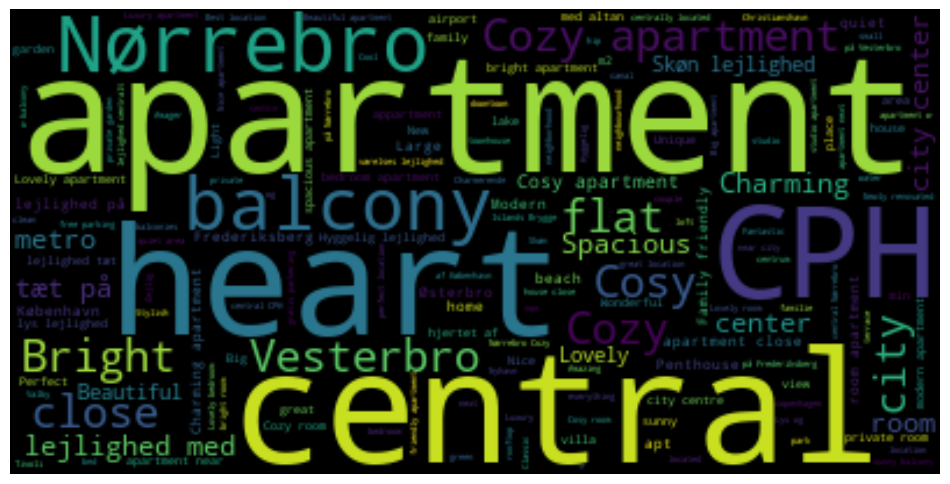

In [658]:
#Name cloud
data['name'] = data['name'].str.replace('Copenhagen','')
names = ' '.join(data['name'])
wordcloud = WordCloud().generate(names)


plt.figure(figsize=(12, 8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

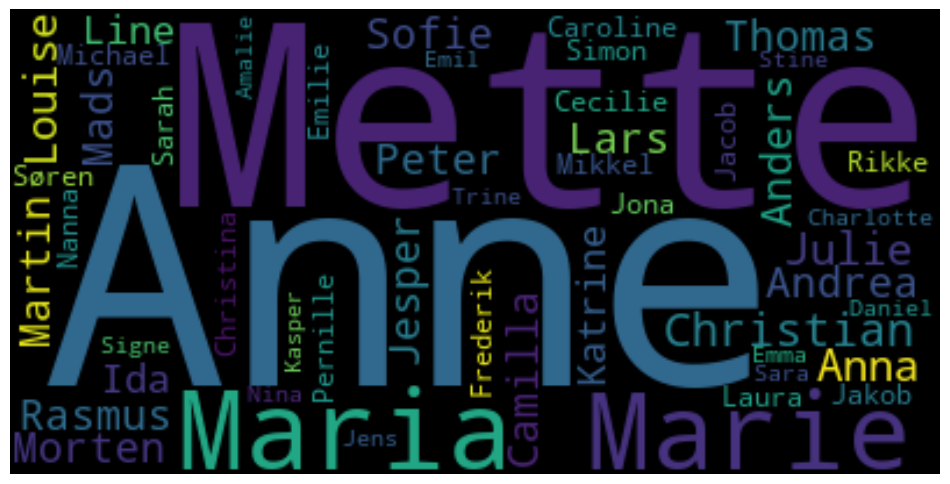

In [659]:
#Hosts' names
names = ' '.join(data['host_name'])
wordcloud = WordCloud().generate(names)


plt.figure(figsize=(12, 8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [660]:
#Binning

# Define the bin edges
bins = np.linspace(1000, 10000, 11)
display(bins)

# Create a new column with the bins
which_bin = np.digitize((data.loc[:,"price"]).astype(float), bins=bins).reshape(-1,1)
which_bin[:10]  

which_bin_df = (pd.DataFrame(which_bin, columns=['Price_bins']))
features_binned = data
features_binned.insert(5, 'Price_bins', which_bin_df)
display(features_binned[0:10])
features_binned.dropna(inplace=True)


array([ 1000.,  1900.,  2800.,  3700.,  4600.,  5500.,  6400.,  7300.,
        8200.,  9100., 10000.])

,id,name,host_id,host_name,neighbourhood_cleansed,Price_bins,latitude,longitude,room_type,price,...,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,reviews_per_month,calculated_host_listings_count,availability_365
0,6983,'N Livin',16774,Simon,Nørrebro,6.0,55.686410,12.547410,Entire home/apt,6286.0,...,4.78,4.79,4.78,4.86,4.89,4.73,4.71,1.08,1,0
1,26057,Lovely house - most attractive area,109777,Kari,Indre By,11.0,55.693070,12.576490,Entire home/apt,18200.0,...,4.91,4.93,4.96,4.93,4.86,4.94,4.81,0.55,1,303
2,26473,City Centre Townhouse Sleeps 1-10 persons,112210,Julia,Indre By,11.0,55.676020,12.575400,Entire home/apt,22750.0,...,4.53,4.63,4.44,4.78,4.70,4.89,4.59,2.06,3,56
3,29118,Best Location in Cool Istedgade,125230,Nana,Vesterbro-Kongens Enghave,5.0,55.670230,12.555040,Entire home/apt,5075.0,...,4.92,4.87,4.73,5.00,5.00,4.87,4.80,0.16,1,59
4,31094,"Beautiful, spacious, central, renovated Penthouse",129976,Ebbe,Vesterbro-Kongens Enghave,11.0,55.666602,12.555283,Entire home/apt,13678.0,...,4.88,4.82,4.88,4.87,4.82,4.80,4.53,0.13,1,0
5,32379,"165 m2 artist flat on Vesterbro, with 2 bathr...",140105,Lise,Vesterbro-Kongens Enghave,9.0,55.672638,12.552493,Entire home/apt,8960.0,...,4.90,4.96,4.92,4.88,4.91,4.88,4.72,0.54,2,60
6,32841,Cozy flat for Adults/Quiet for kids,142143,Anders & Maria,Østerbro,4.0,55.711760,12.570910,Entire home/apt,4319.0,...,4.57,4.75,4.50,5.00,5.00,4.50,4.50,0.05,1,281
7,33680,Best location on Vesterbro/Cph,145671,Mette,Vesterbro-Kongens Enghave,7.0,55.666310,12.545550,Entire home/apt,7000.0,...,4.74,4.75,4.67,4.91,4.91,4.80,4.67,0.48,1,312
8,37159,Unique space on greatest location,160390,Jeanette,Indre By,11.0,55.685470,12.565430,Entire home/apt,20412.0,...,5.00,4.78,5.00,5.00,5.00,4.89,4.78,0.07,1,0
9,38499,0 min. from everything in Cph.,122489,Christina,Indre By,11.0,55.684288,12.573019,Entire home/apt,13300.0,...,5.00,4.56,4.89,5.00,5.00,5.00,4.89,0.10,1,87


C:\Users\Lukas\AppData\Local\Temp\ipykernel_18172\3979353614.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  features_binned.dropna(inplace=True)


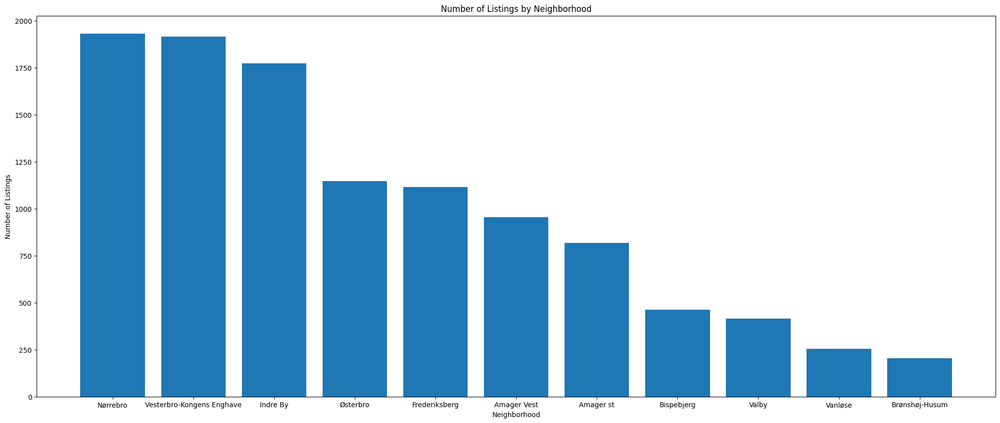

In [661]:
#Latitue, longitude map
# Define colors for the price bins
colors = ['green', 'green', 'green', 'yellow', 'yellow', 'orange', 'orange', 'red', 'red', 'red', 'red']

# Create a folium map centered around a location (e.g., Copenhagen)
m = folium.Map(location=[55.6761, 12.5683], zoom_start=6)

# Plot the data points on the map
for index, row in features_binned.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=5,
        color=colors[(int(row['Price_bins'])) - 1],  # Use the color corresponding to the price bin
        fill=True,
        fill_color=colors[int(row['Price_bins']) - 1],
        fill_opacity=0.7,
        popup=f'Price Bin: {row["Price_bins"]}'
    ).add_to(m)

# Display the map
display(m)

neighborhood_counts = features_binned['neighbourhood_cleansed'].value_counts().reset_index()
neighborhood_counts.columns = ['neighborhood', 'count']

# Create a bar plot
plt.figure(figsize=(25, 10))
plt.bar(neighborhood_counts['neighborhood'], neighborhood_counts['count'])
plt.xlabel('Neighborhood')
plt.ylabel('Number of Listings')
plt.title('Number of Listings by Neighborhood')
plt.show()

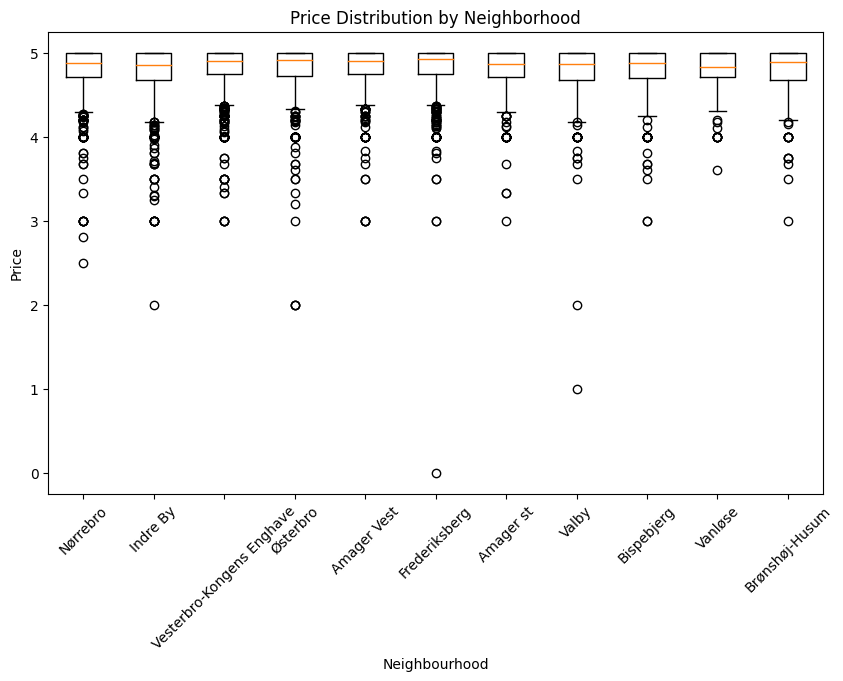

In [662]:
#box plots

# Create boxplots using matplotlib
plt.figure(figsize=(10, 6))
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.xlabel('Neighbourhood')
plt.ylabel('Price')
plt.title('Price Distribution by Neighborhood')
plt.boxplot([features_binned[features_binned['neighbourhood_cleansed'] == neighborhood]['review_scores_rating'] for neighborhood in features_binned['neighbourhood_cleansed'].unique()],
            labels=features_binned['neighbourhood_cleansed'].unique())
plt.show()

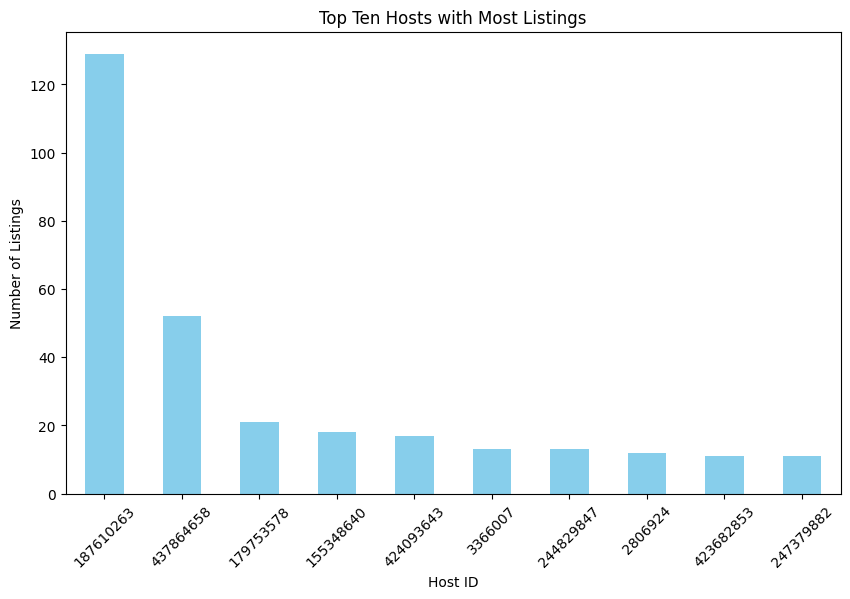

In [663]:
#Top 10 listing hosts

# Calculate the top ten hosts with the most listings
top_hosts = features_binned['host_id'].value_counts().head(10)

# Create a bar chart
plt.figure(figsize=(10, 6))
top_hosts.plot(kind='bar', color='skyblue')
plt.xlabel('Host ID')
plt.ylabel('Number of Listings')
plt.title('Top Ten Hosts with Most Listings')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.show()

In [664]:
#Descriptive analysis


# Group by neighborhood and calculate descriptive statistics for room_type and overall rating
neighborhood_price = features_binned.groupby('neighbourhood_cleansed')['Price_bins'].describe()
neighborhood_rating = features_binned.groupby('neighbourhood_cleansed')['review_scores_rating'].describe()

# Display the summary statistics for 'another_feature' by neighborhood
print("Descriptive Analysis of Neighborhoods and price\n")
display(neighborhood_price)
print("\nDescriptive Analysis of Neighborhoods and rating\n")
display(neighborhood_rating)

Descriptive Analysis of Neighborhoods and price



,count,mean,std,min,25%,50%,75%,max
neighbourhood_cleansed,,,,,,,,
Amager Vest,956.0,7.033473,2.772892,0.0,5.0,7.0,10.0,11.0
Amager st,819.0,7.131868,2.801012,0.0,5.0,7.0,10.0,11.0
Bispebjerg,462.0,7.034632,2.868577,1.0,5.0,7.0,10.0,11.0
Brønshøj-Husum,205.0,7.131707,2.855545,1.0,5.0,7.0,10.0,11.0
Frederiksberg,1116.0,7.174731,2.834276,0.0,5.0,7.0,10.0,11.0
Indre By,1775.0,7.237183,2.875385,1.0,5.0,7.0,10.0,11.0
Nørrebro,1931.0,7.136717,2.804503,1.0,5.0,7.0,10.0,11.0
Valby,415.0,7.303614,2.830879,1.0,5.0,7.0,10.0,11.0
Vanløse,255.0,7.145098,2.854497,1.0,5.0,7.0,10.0,11.0



Descriptive Analysis of Neighborhoods and rating



,count,mean,std,min,25%,50%,75%,max
neighbourhood_cleansed,,,,,,,,
Amager Vest,956.0,4.827594,0.247234,3.0,4.750,4.90,5.0,5.0
Amager st,819.0,4.804896,0.243308,3.0,4.705,4.87,5.0,5.0
Bispebjerg,462.0,4.788896,0.289678,3.0,4.700,4.88,5.0,5.0
Brønshøj-Husum,205.0,4.771756,0.318007,3.0,4.670,4.89,5.0,5.0
Frederiksberg,1116.0,4.826729,0.284891,0.0,4.750,4.92,5.0,5.0
Indre By,1775.0,4.772220,0.285593,2.0,4.670,4.85,5.0,5.0
Nørrebro,1931.0,4.805831,0.253132,2.5,4.710,4.88,5.0,5.0
Valby,415.0,4.765807,0.356554,1.0,4.670,4.86,5.0,5.0
Vanløse,255.0,4.792941,0.237466,3.6,4.710,4.83,5.0,5.0


In [665]:
#Top 10 listings on the map

# Sort the DataFrame by 'rating' in descending order and select the top 10 listings
top_rated_listings = features_binned.sort_values(by='review_scores_rating', ascending=False).head(10)

# Create a Folium map centered around a location
m = folium.Map(location=[55.6761, 12.5683], zoom_start=6)

# Add markers for the top-rated listings to the map
for index, row in top_rated_listings.iterrows():
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        popup=f'Rating: {row["review_scores_rating"]}',
        icon=folium.Icon(color='blue')
    ).add_to(m)

# Display the map
display(m)

In [666]:
# Affordable and expensive labels

priceCat = features_binned['Price_bins'].apply(lambda x: 'expensive' if x > 6 else 'affordable')
features_binned.insert(5, 'price_category', priceCat)
display(features_binned[0:10])

,id,name,host_id,host_name,neighbourhood_cleansed,price_category,Price_bins,latitude,longitude,room_type,...,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,reviews_per_month,calculated_host_listings_count,availability_365
0,6983,'N Livin',16774,Simon,Nørrebro,affordable,6.0,55.686410,12.547410,Entire home/apt,...,4.78,4.79,4.78,4.86,4.89,4.73,4.71,1.08,1,0
1,26057,Lovely house - most attractive area,109777,Kari,Indre By,expensive,11.0,55.693070,12.576490,Entire home/apt,...,4.91,4.93,4.96,4.93,4.86,4.94,4.81,0.55,1,303
2,26473,City Centre Townhouse Sleeps 1-10 persons,112210,Julia,Indre By,expensive,11.0,55.676020,12.575400,Entire home/apt,...,4.53,4.63,4.44,4.78,4.70,4.89,4.59,2.06,3,56
3,29118,Best Location in Cool Istedgade,125230,Nana,Vesterbro-Kongens Enghave,affordable,5.0,55.670230,12.555040,Entire home/apt,...,4.92,4.87,4.73,5.00,5.00,4.87,4.80,0.16,1,59
4,31094,"Beautiful, spacious, central, renovated Penthouse",129976,Ebbe,Vesterbro-Kongens Enghave,expensive,11.0,55.666602,12.555283,Entire home/apt,...,4.88,4.82,4.88,4.87,4.82,4.80,4.53,0.13,1,0
5,32379,"165 m2 artist flat on Vesterbro, with 2 bathr...",140105,Lise,Vesterbro-Kongens Enghave,expensive,9.0,55.672638,12.552493,Entire home/apt,...,4.90,4.96,4.92,4.88,4.91,4.88,4.72,0.54,2,60
6,32841,Cozy flat for Adults/Quiet for kids,142143,Anders & Maria,Østerbro,affordable,4.0,55.711760,12.570910,Entire home/apt,...,4.57,4.75,4.50,5.00,5.00,4.50,4.50,0.05,1,281
7,33680,Best location on Vesterbro/Cph,145671,Mette,Vesterbro-Kongens Enghave,expensive,7.0,55.666310,12.545550,Entire home/apt,...,4.74,4.75,4.67,4.91,4.91,4.80,4.67,0.48,1,312
8,37159,Unique space on greatest location,160390,Jeanette,Indre By,expensive,11.0,55.685470,12.565430,Entire home/apt,...,5.00,4.78,5.00,5.00,5.00,4.89,4.78,0.07,1,0
9,38499,0 min. from everything in Cph.,122489,Christina,Indre By,expensive,11.0,55.684288,12.573019,Entire home/apt,...,5.00,4.56,4.89,5.00,5.00,5.00,4.89,0.10,1,87


In [668]:
# Naive bayes and KNN


label_encoder = LabelEncoder()
features_binned['neighbourhood_encoded'] = label_encoder.fit_transform(features_binned['neighbourhood_cleansed'])
features_binned['room_type_encoded'] = label_encoder.fit_transform(features_binned['room_type'])
display(features_binned[0:5])

# Split the data into training and test sets
X = features_binned[['latitude', 'longitude', 'review_scores_rating', 'availability_365', 'neighbourhood_encoded', 'room_type_encoded', 'Price_bins', 'reviews_per_month']]  # Select relevant features
y = features_binned['price_category']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 3: Model Selection and Training
# Naïve Bayes
nb_model = GaussianNB()
nb_model.fit(X_train, y_train)

# KNN (with hyperparameter tuning)
knn_model = KNeighborsClassifier(n_neighbors=10) 
knn_model.fit(X_train, y_train)

# Step 4: Model Evaluation
y_pred_nb = nb_model.predict(X_test)
y_pred_knn = knn_model.predict(X_test)

accuracy_nb = accuracy_score(y_test, y_pred_nb)
accuracy_knn = accuracy_score(y_test, y_pred_knn)

print("Naïve Bayes Accuracy:", accuracy_nb)
print("KNN Accuracy:", accuracy_knn)

# Print classification reports for more detailed evaluation
print("\nNaïve Bayes Classification Report:")
print(classification_report(y_test, y_pred_nb))

print("\nKNN Classification Report:")
print(classification_report(y_test, y_pred_knn))

C:\Users\Lukas\AppData\Local\Temp\ipykernel_18172\2816492627.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  features_binned['neighbourhood_encoded'] = label_encoder.fit_transform(features_binned['neighbourhood_cleansed'])
C:\Users\Lukas\AppData\Local\Temp\ipykernel_18172\2816492627.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  features_binned['room_type_encoded'] = label_encoder.fit_transform(features_binned['room_type'])


,id,name,host_id,host_name,neighbourhood_cleansed,price_category,Price_bins,latitude,longitude,room_type,...,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,reviews_per_month,calculated_host_listings_count,availability_365,neighbourhood_encoded,room_type_encoded
0,6983,'N Livin',16774,Simon,Nørrebro,affordable,6.0,55.686410,12.547410,Entire home/apt,...,4.78,4.86,4.89,4.73,4.71,1.08,1,0,6,0
1,26057,Lovely house - most attractive area,109777,Kari,Indre By,expensive,11.0,55.693070,12.576490,Entire home/apt,...,4.96,4.93,4.86,4.94,4.81,0.55,1,303,5,0
2,26473,City Centre Townhouse Sleeps 1-10 persons,112210,Julia,Indre By,expensive,11.0,55.676020,12.575400,Entire home/apt,...,4.44,4.78,4.70,4.89,4.59,2.06,3,56,5,0
3,29118,Best Location in Cool Istedgade,125230,Nana,Vesterbro-Kongens Enghave,affordable,5.0,55.670230,12.555040,Entire home/apt,...,4.73,5.00,5.00,4.87,4.80,0.16,1,59,9,0
4,31094,"Beautiful, spacious, central, renovated Penthouse",129976,Ebbe,Vesterbro-Kongens Enghave,expensive,11.0,55.666602,12.555283,Entire home/apt,...,4.88,4.87,4.82,4.80,4.53,0.13,1,0,9,0


Naïve Bayes Accuracy: 0.9990909090909091
KNN Accuracy: 0.9563636363636364

Naïve Bayes Classification Report:
              precision    recall  f1-score   support

  affordable       1.00      1.00      1.00      1003
   expensive       1.00      1.00      1.00      1197

    accuracy                           1.00      2200
   macro avg       1.00      1.00      1.00      2200
weighted avg       1.00      1.00      1.00      2200


KNN Classification Report:
              precision    recall  f1-score   support

  affordable       0.93      0.98      0.95      1003
   expensive       0.98      0.94      0.96      1197

    accuracy                           0.96      2200
   macro avg       0.96      0.96      0.96      2200
weighted avg       0.96      0.96      0.96      2200

